# Convolutions

In [187]:
using Pkg
environmentName = "08-convolutions"
Pkg.activate(joinpath(dirname(pwd()), "conf", environmentName))
Pkg.instantiate();

  Activating project at `~/Syncthing/Programmierung/MathData-SoSe22/conf/08-convolutions`


# Kernel

Zuerst betrachten wir verschiedene Kernel und deren Effekte auf Bilder. Der erste Kernel nennt sich Sobel-Kernel und wird zur Erkennung von vertikalen Kanten verwendet. Wir wenden den Kernel auf das Bild "Entrance to the Grand Canal near the Punta della Dogana and Santa Maria della Salute" an.

In [188]:
sobel_filter = Float32.([1 0 -1; 2 0 -2; 1 0 -1]);    
ridge1_filter = [0 -1 0; -1 4 -1; 0 -1 0];
ridge2_filter = [-1 -1 -1; -1 8 -1; -1 -1 -1];
sharp_filter = [0 -1 0; -1 5 -1; 0 -1 0];
gaussian_blurr_filter = [1 2 1; 2 4 2; 1 2 1] / 16;

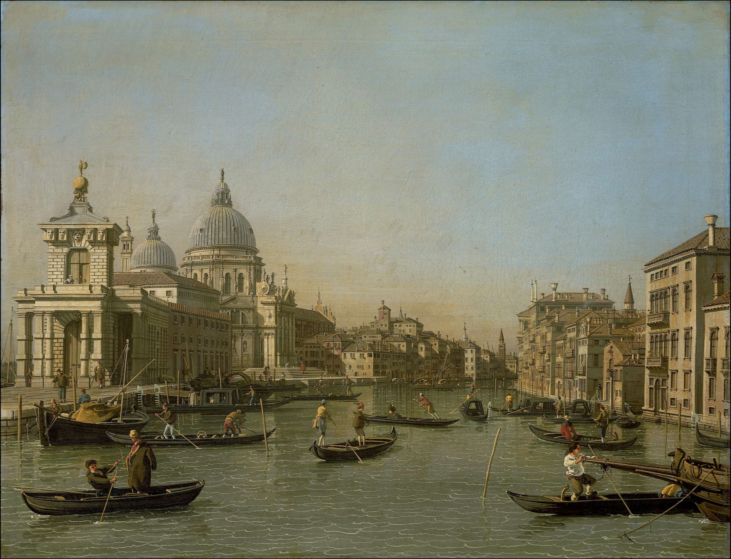

In [189]:
using Images, ImageView
img = load(joinpath("..", "data", environmentName, "example_image.jpeg"))

In [190]:
size(img)

(2232, 2918)

In [191]:
using DSP

function convolve(image, kernel)
    width = size(image)[1]
    height = size(image)[2]

    # split input into channels
    red_image = [Float32(image[i, j].r) for i in 1:width, j in 1:height]
    green_image = [Float32(image[i, j].g) for i in 1:width, j in 1:height]
    blue_image = [Float32(image[i, j].b) for i in 1:width, j in 1:height]

    # channel outputs
    red_conv_output = clamp.(convolve_matrix(red_image, kernel), 0, 1)
    green_conv_output = clamp.(convolve_matrix(green_image, kernel), 0, 1)
    blue_conv_output = clamp.(convolve_matrix(blue_image, kernel), 0, 1)

    # construct output image
    return [RGB(red_conv_output[i, j], green_conv_output[i, j], blue_conv_output[i, j]) for i in 1:width, j in 1:height]
end

function convolve_matrix(M, N)
    M_width = size(M)[1]
    M_height = size(M)[2]
    N_width = size(N)[1]
    N_height = size(N)[2]
    width_padding = Int32(floor((N_width - 1) / 2))
    height_padding = Int32(floor((N_height - 1) / 2))
    # output with zero-padding
    output = Float32.(zeros(M_width + 2 * width_padding, M_height + 2 * height_padding))
    # convolution
    DSP.conv!(output, M, N; algorithm=:direct)
    # cut away the padding
    actual_output = output[1+width_padding:end-width_padding, 1+height_padding:end-height_padding]
    return actual_output
end

convolve_matrix (generic function with 1 method)

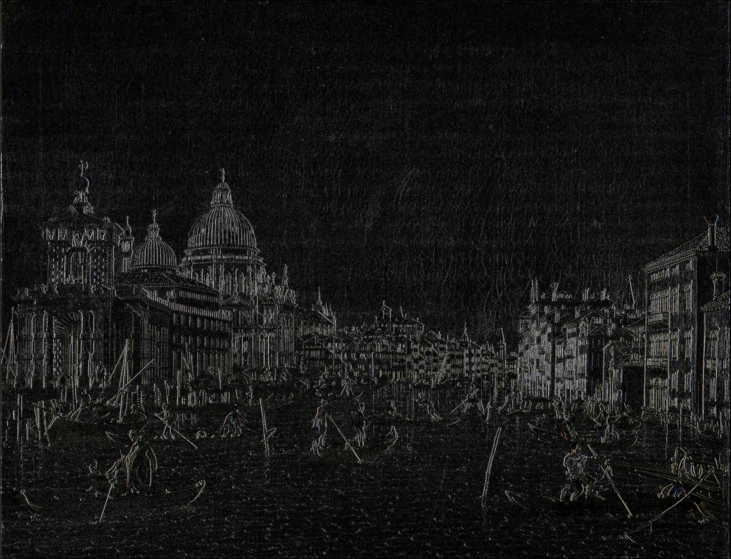

In [192]:
convolve(img, sobel_filter)

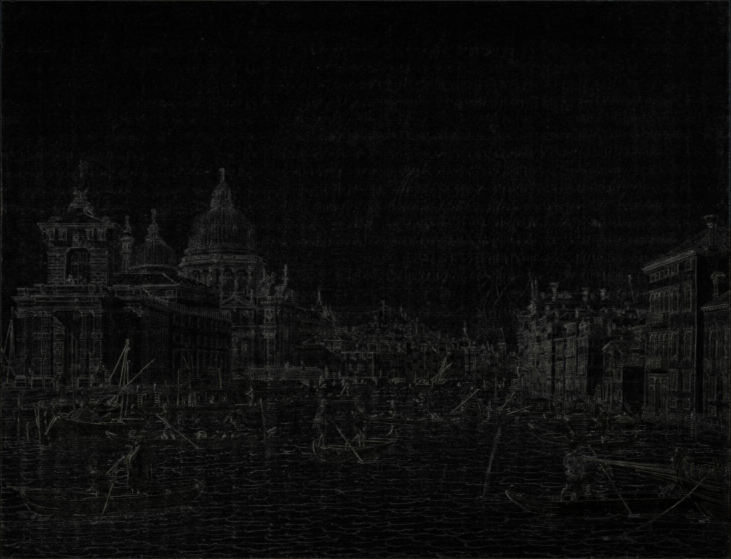

In [193]:
convolve(img, ridge1_filter)

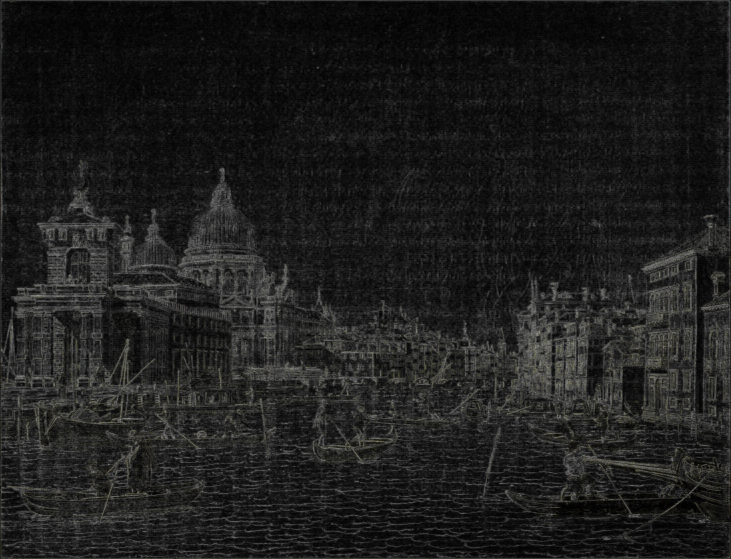

In [194]:
convolve(img, ridge2_filter)

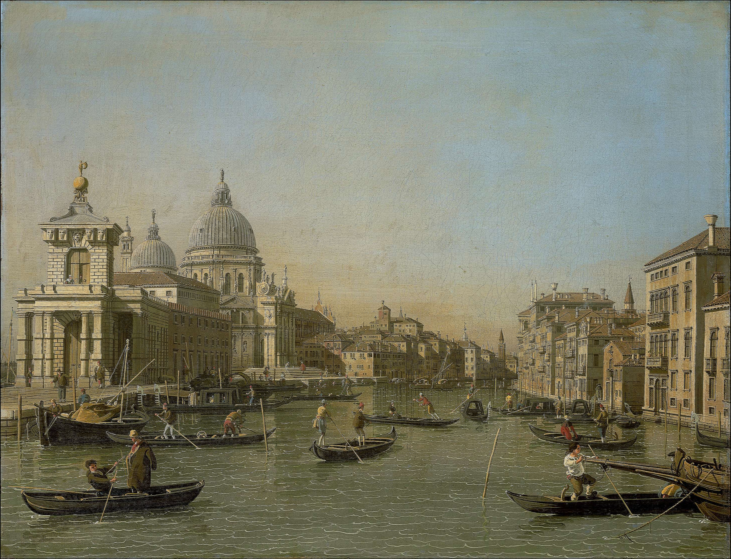

In [195]:
convolve(img, sharp_filter)

# Prewitt Kernel
$G_x$ filtert vertikale Linien während $G_y$ horizontale Linien filtert.

In [196]:
G_x = [1 0 -1; 1 0 -1; 1 0 -1]

3×3 Matrix{Int64}:
 1  0  -1
 1  0  -1
 1  0  -1

In [197]:
G_y = [1 1 1; 0 0 0; -1 -1 -1]

3×3 Matrix{Int64}:
  1   1   1
  0   0   0
 -1  -1  -1

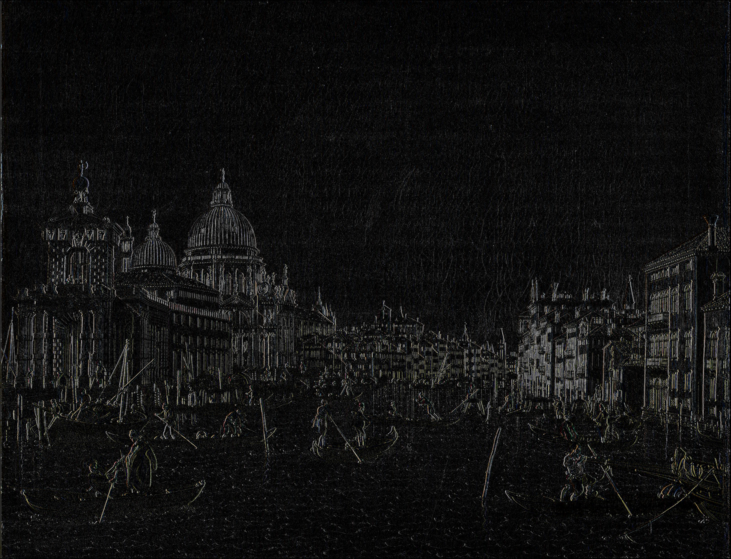

In [198]:
convolve(img, G_x)

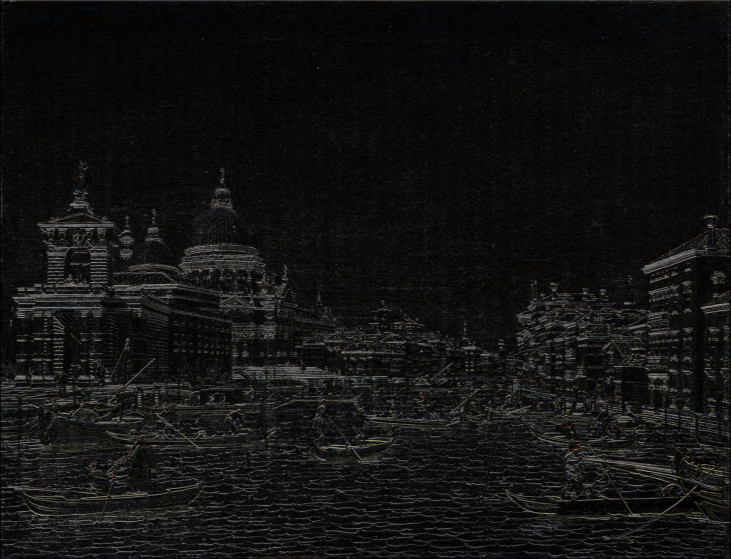

In [199]:
convolve(img, G_y)

In [200]:
convolve_matrix(G_x, G_y) == convolve_matrix(G_y, G_x)

true

In [201]:
convolve_matrix(G_x, G_y)

3×3 Matrix{Float32}:
  1.0  0.0  -1.0
  0.0  0.0   0.0
 -1.0  0.0   1.0

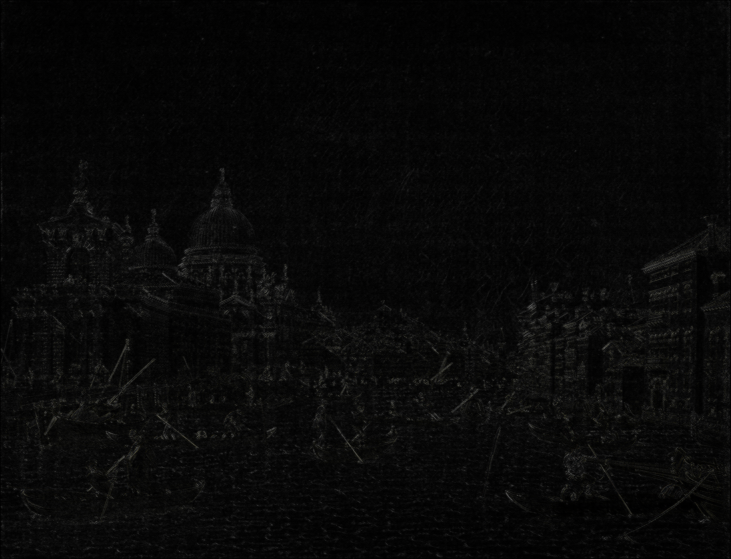

In [202]:
convolve(img, convolve_matrix(G_x, G_y))

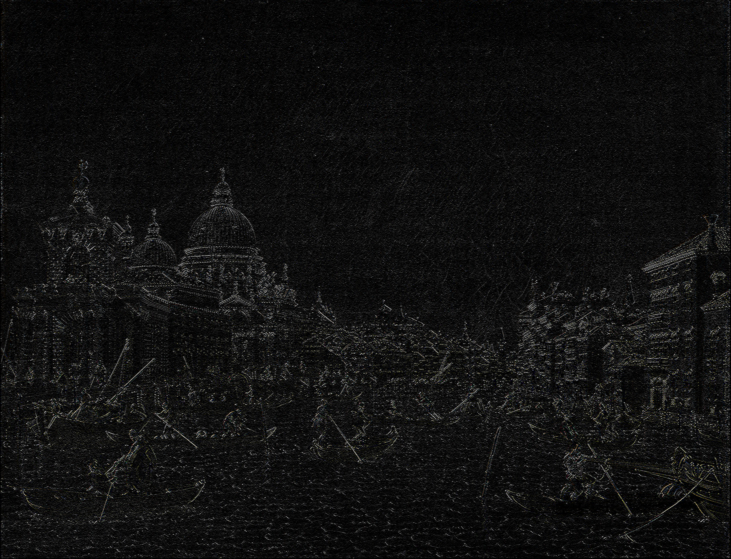

In [203]:
convolve(convolve(img, G_x), G_y)

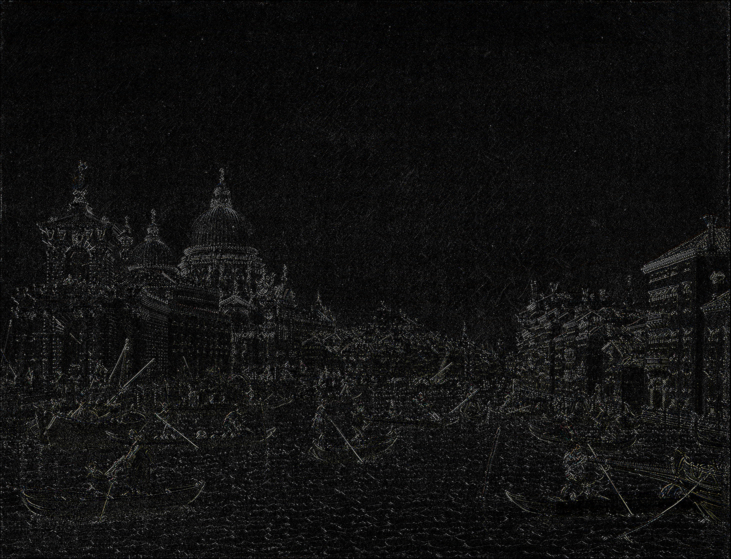

In [204]:
convolve(convolve(img, G_y), G_x)

In [205]:
(G_x + G_y)

3×3 Matrix{Int64}:
 2   1   0
 1   0  -1
 0  -1  -2

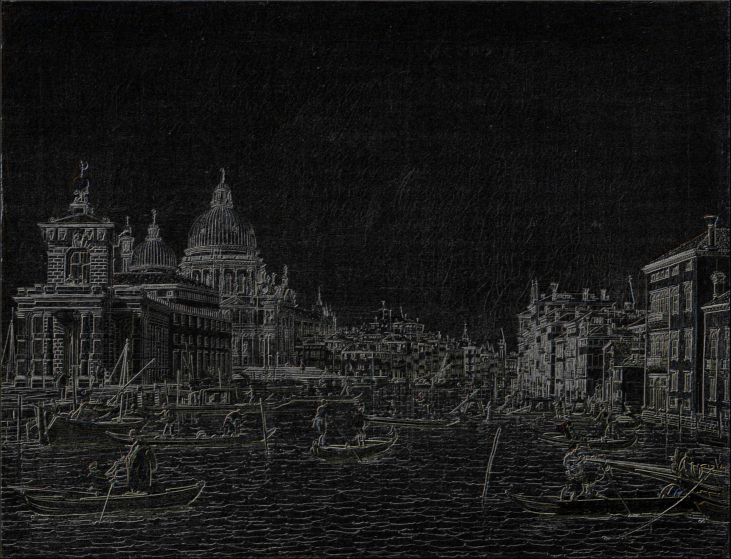

In [206]:
convolve(img, (G_x + G_y))